### Check dredFISH Data

In [5]:
from dredFISH.Processing.Section import *
metadata_path = '/bigstore/Images2022/gaby/dredFISH/1500uM_DPMF_test_2022May13/'
dataset = [i for i in metadata_path.split('/') if not i==''][-1]
cword_config = 'dredfish_processing_config'
config = importlib.import_module(cword_config)
results_path = os.path.join(metadata_path,config.parameters['results'])
out_path = config.parameters['outpath']
section = 'Section_2910X_2910Y'
self = Section_Class(metadata_path,dataset,section,cword_config,verbose=True)
self.config.parameters['fishdata'] = 'fishdata'
self.load_data()

/home/zach/miniconda3/envs/dredfish_3.9/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

11:14:43 Loading Data: 0it [00:00, ?it/s]
11:14:43 Loading Metadata: 0it [00:00, ?it/s]


In [1]:
self.metadata_path

NameError: name 'self' is not defined

11:15:14 Stitching Images: 0it [00:00, ?it/s]
Generate Images nucstain_3_DeepBlue: 100%|██████████| 54/54 [01:04<00:00,  1.20s/it]
11:16:37 Downsampling Stitched: 0it [00:00, ?it/s]
11:16:57 Saving Stitched: 0it [00:00, ?it/s]


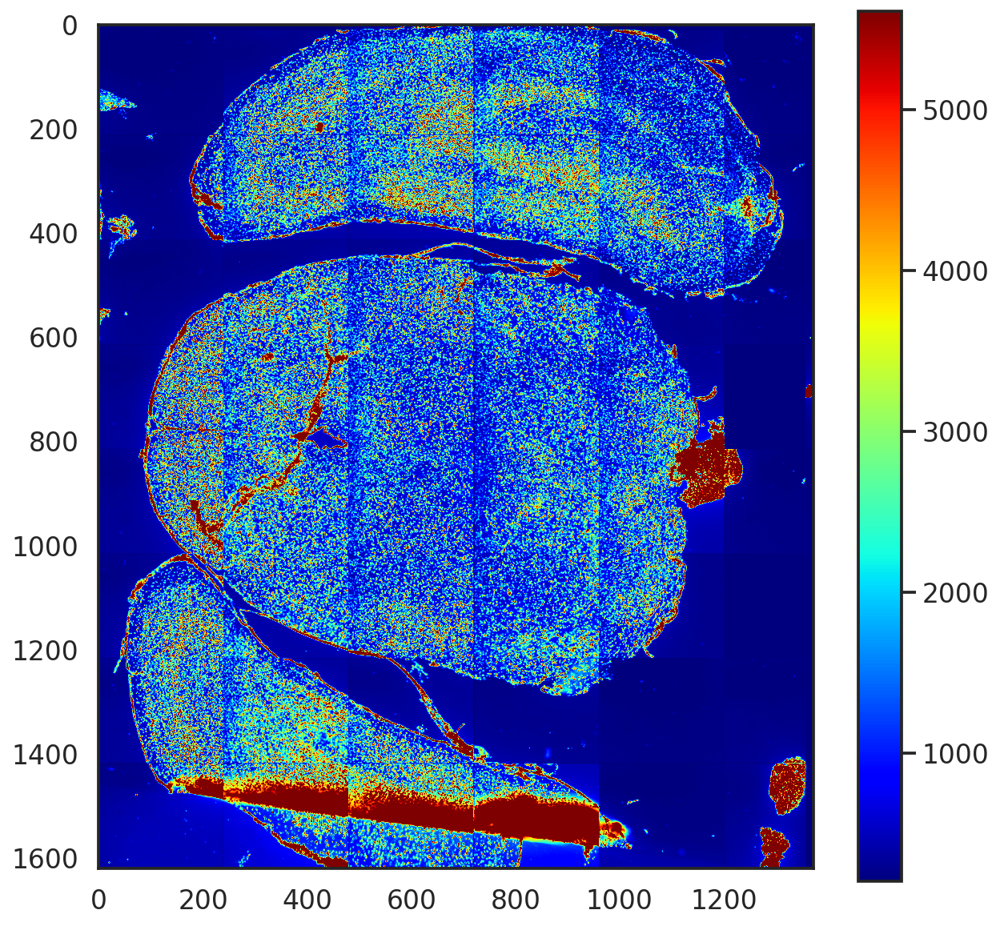

In [7]:
img = self.generate_stitched('nucstain_3','DeepBlue')
s = img[img>0].ravel()
vmin,vmax = np.percentile(s,[5,95])
temp_img = img.copy()
dim1_mask = temp_img.mean(0)>vmin
dim2_mask = temp_img.mean(1)>vmin
temp_img = temp_img[:,dim1_mask]
temp_img = temp_img[dim2_mask,:]
plt.figure(figsize=[10,10])
plt.imshow(temp_img,vmin=vmin,vmax=vmax,cmap='jet')
plt.colorbar()
plt.show()

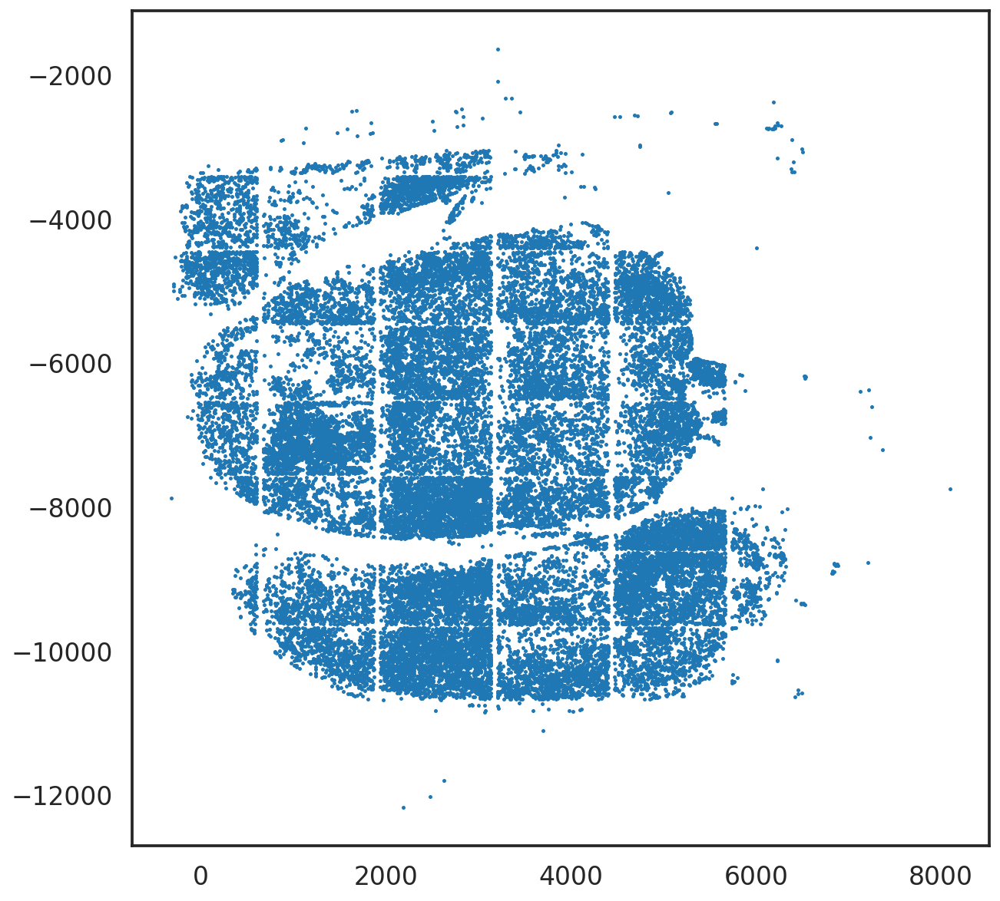

In [9]:
import matplotlib.pyplot as plt 
plt.figure(figsize=[10,10])
plt.scatter(self.data.obs['stage_x'],self.data.obs['stage_y'],s=1)
plt.show()

### Remove Outliers

In [1]:
from dredFISH.Processing.Section import *
import matplotlib.pyplot as plt 
import torch
metadata_path = '/bigstore/Images2022/gaby/dredFISH/1500uM_DPMF_test_2022May13/'
dataset = [i for i in metadata_path.split('/') if not i==''][-1]
cword_config = 'dredfish_processing_config'
config = importlib.import_module(cword_config)
results_path = os.path.join(metadata_path,config.parameters['results'])
out_path = config.parameters['outpath']
section = 'Section_2910X_2910Y'
self = Section_Class(metadata_path,dataset,section,cword_config,verbose=True)
self.config.parameters['fishdata'] = 'fishdata'
self.load_data()

/home/zach/miniconda3/envs/dredfish_3.9/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
16:09:45 Loading Metadata: 0it [00:00, ?it/s]
16:09:48 Loading Data: 0it [00:00, ?it/s]


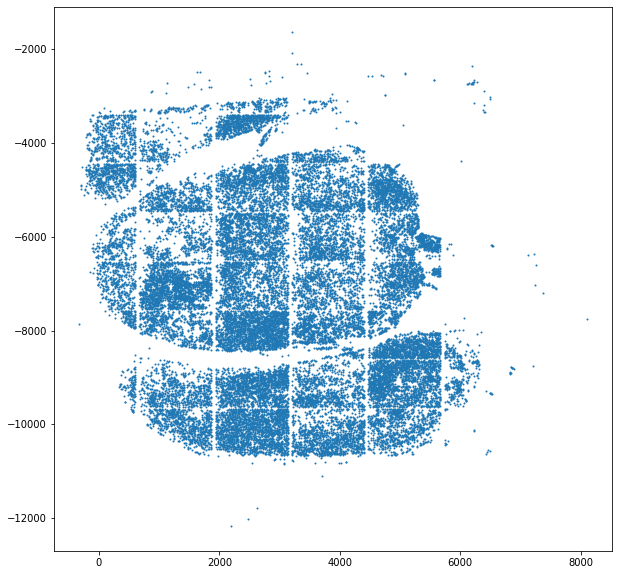

In [2]:
plt.figure(figsize=[10,10])
plt.scatter(self.data.obs['stage_x'],self.data.obs['stage_y'],s=1)
plt.show()

In [3]:
XY = torch.tensor(self.data.obsm['stage'].copy())
center = torch.median(XY,axis=0).values
distances = torch.cdist(XY,center[:,None].T).numpy()
thresh = np.percentile(distances,99)
mask = distances<thresh
self.data = self.data[mask]

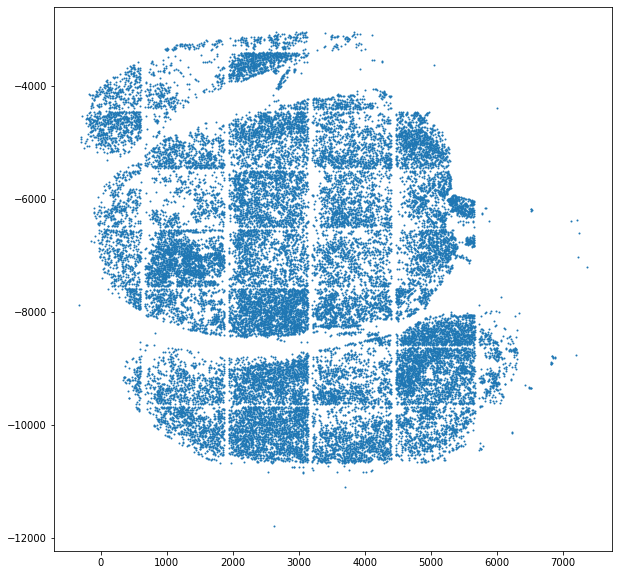

In [4]:
plt.figure(figsize=[10,10])
plt.scatter(self.data.obs['stage_x'],self.data.obs['stage_y'],s=1)
plt.show()

### Check Registration

In [2]:
""" Check Reference Registration """
from dredFISH.Utils import regu
import importlib
importlib.reload(regu)
import nrrd
# allen data
allen_template_path='/bigstore/binfo/mouse/Brain/average_template.npy'
allen_tree_path='/bigstore/GeneralStorage/fangming/reference/allen_ccf/structures.json'
allen_annot_path='/bigstore/GeneralStorage/fangming/reference/allen_ccf/annotation_10.nrrd'

# dredFISH data
dataset = 'DPNMF_PolyA_2021Nov19' # dataset tag
base_path = '/bigstore/Images2021/gaby/dredFISH/DPNMF_PolyA_2021Nov19/'
fish_path = f'{base_path}fishdata_2022Mar23/' # Zach's new version
anndata_path = f'{base_path}results/raw_fishdata_Mar30.h5ad'

allen_template = regu.load_allen_template(allen_template_path)
allen_tree, allen_maps = regu.load_allen_tree(allen_tree_path)
allen_annot = regu.load_allen_annot(allen_annot_path) # takes about 30 seconds


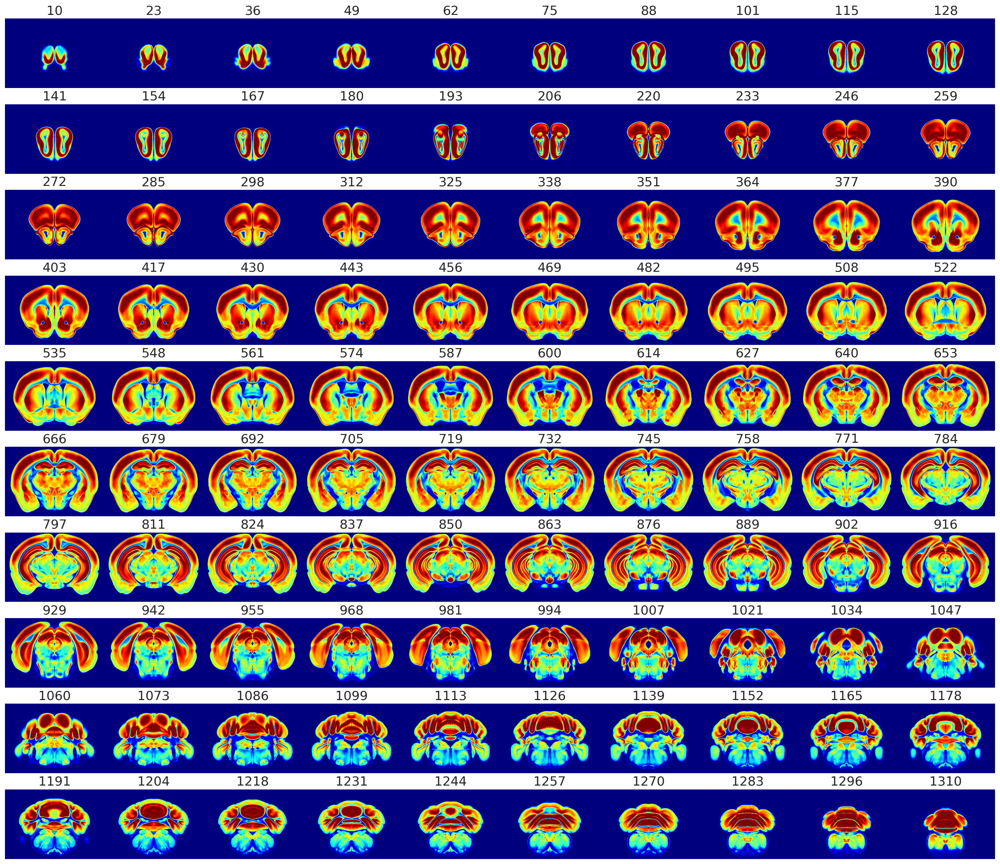

In [3]:
import matplotlib.pyplot as plt 
import numpy as np
rows = 10
columns = 10
fig, axs = plt.subplots(columns,rows,figsize=[25,22],)
nbins = columns*rows
bins = np.linspace(10,allen_template.shape[0]-10,nbins).astype(int)
i = 0
for ax in axs.ravel():
    bin = bins[i]
    img = allen_template[bin,:,:]
    if img.max()==0:
        continue
    vmin,vmax=np.percentile(img[img>0].ravel(),[5,95])
    ax.imshow(img,vmin=vmin,vmax=vmax,cmap='jet')
    ax.set_title(bin)
    ax.set_axis_off()
    i+=1
plt.subplots_adjust(wspace=0, 
                    hspace=0.1)

In [4]:
from dredFISH.Processing.Section import *
metadata_path = '/bigstore/Images2022/gaby/dredFISH/1500uM_DPMF_test_2022May13/'
dataset = [i for i in metadata_path.split('/') if not i==''][-1]
cword_config = 'dredfish_processing_config'
config = importlib.import_module(cword_config)
results_path = os.path.join(metadata_path,config.parameters['results'])
out_path = config.parameters['outpath']
section = 'Section_2910X_2910Y'
self = Section_Class(metadata_path,dataset,section,cword_config,verbose=True)
self.config.parameters['fishdata'] = 'fishdata'
self.load_h5ad()
self.remove_outliers()

12:13:19 Loading Data: 0it [00:00, ?it/s]
12:13:19 Removing Outliers: 0it [00:00, ?it/s]


/bigstore/Images2022/gaby/dredFISH/1500uM_DPMF_test_2022May13/Results/registration_1500uM_DPMF_test_2022May13_Section_2910X_2910Y


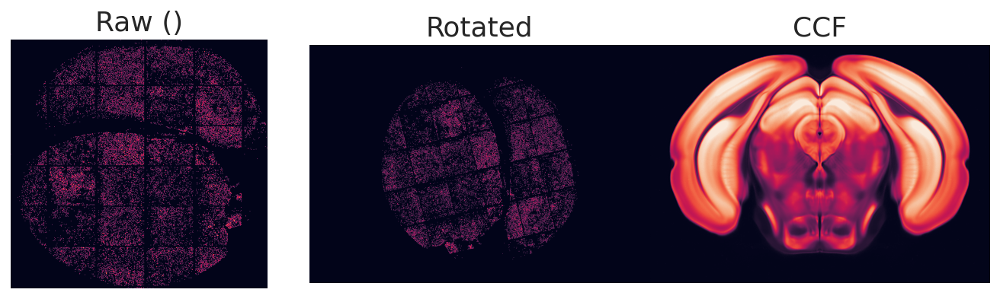

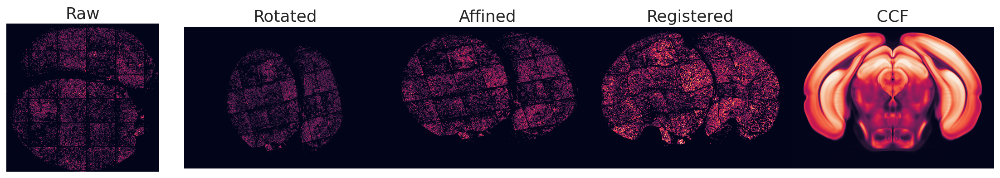

Trying to set attribute `.obs` of view, copying.


saved to /bigstore/Images2022/gaby/dredFISH/1500uM_DPMF_test_2022May13/Results/registration_1500uM_DPMF_test_2022May13_Section_2910X_2910Yregistered.hdf5


/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/anndata/_core/anndata.py:1228: FutureWarning:

The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.

... storing 'region_color' as categorical
/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/anndata/_core/anndata.py:1228: FutureWarning:

The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.

... storing 'region_acronym' as categorical


In [5]:
self.config.parameters['registration_idx'] = 916
self.config.parameters['registration_flip'] = True
self.config.parameters['registration_force'] = True
self.config.parameters['registration_output_prefix'] = os.path.join(
    self.metadata_path, self.config.parameters['results'], 'registration_'+self.dataset+'_'+self.section
)
print(self.config.parameters['registration_output_prefix'])

self.config.parameters['allen_template_path'] ='/bigstore/binfo/mouse/Brain/average_template.npy'
self.config.parameters['allen_tree_path'] ='/bigstore/GeneralStorage/fangming/reference/allen_ccf/structures.json'
self.config.parameters['allen_annot_path'] ='/bigstore/GeneralStorage/fangming/reference/allen_ccf/annotation_10.nrrd'
# self.load_allen()
# or preload to save time
self.allen_template = allen_template
self.allen_tree = allen_tree
self.allen_maps = allen_maps
self.allen_annot = allen_annot
self.register_preview()
self.register()

In [6]:
self.data.obs

,label,pixel_x,pixel_y,nuclei_size,nuclei_signal,cytoplasm_size,cytoplasm_signal,total_size,total_signal,posname,...,cell_name,stage_x,stage_y,dataset,section_index,coord_x,coord_y,region_id,region_color,region_acronym
1500uM_DPMF_test_2022May13_Section_2910X_2910Y_Pos173_Cell1,1.0,11.872159,214.464493,704.0,1317.333333,5.0,1184.000000,560.0,1306.666667,Pos173,...,1500uM_DPMF_test_2022May13_Pos173_cell_1.0,1764.912399,-5443.182642,1500uM_DPMF_test_2022May13,0,-2558.030663,-810.394303,185,#08858C,VISl6b
1500uM_DPMF_test_2022May13_Section_2910X_2910Y_Pos173_Cell2,2.0,9.740554,284.327454,397.0,1429.333333,184.0,1216.000000,581.0,1349.333333,Pos173,...,1500uM_DPMF_test_2022May13_Pos173_cell_2.0,1730.679548,-5444.227129,1500uM_DPMF_test_2022May13,0,-2565.043924,-843.917328,185,#08858C,VISl6b
1500uM_DPMF_test_2022May13_Section_2910X_2910Y_Pos173_Cell4,4.0,2.807692,631.743591,78.0,1072.000000,137.0,880.000000,214.0,906.666667,Pos173,...,1500uM_DPMF_test_2022May13_Pos173_cell_4.0,1560.445640,-5447.624231,1500uM_DPMF_test_2022May13,0,-2601.666455,-1010.199960,184,#08858C,VISl6a
1500uM_DPMF_test_2022May13_Section_2910X_2910Y_Pos173_Cell5,5.0,2.544304,718.670898,79.0,1157.333333,144.0,1264.000000,223.0,1221.333333,Pos173,...,1500uM_DPMF_test_2022May13_Pos173_cell_5.0,1517.851260,-5447.753291,1500uM_DPMF_test_2022May13,0,-2611.530636,-1051.636609,184,#08858C,VISl6a
1500uM_DPMF_test_2022May13_Section_2910X_2910Y_Pos173_Cell6,6.0,8.000000,761.953003,234.0,1381.333333,196.0,1488.000000,430.0,1418.666667,Pos173,...,1500uM_DPMF_test_2022May13_Pos173_cell_6.0,1496.643029,-5445.080000,1500uM_DPMF_test_2022May13,0,-2619.103324,-1071.626355,184,#08858C,VISl6a
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1500uM_DPMF_test_2022May13_Section_2910X_2910Y_Pos133_Cell510,510.0,1203.452393,1828.813232,557.0,2698.666667,1923.0,1381.333333,2480.0,1669.333333,Pos133,...,1500uM_DPMF_test_2022May13_Pos133_cell_510.0,6040.881516,-7993.308328,1500uM_DPMF_test_2022May13,0,923.810617,2748.233832,1141,#CCCCCC,ll
1500uM_DPMF_test_2022May13_Section_2910X_2910Y_Pos133_Cell512,512.0,1213.580811,2087.568848,167.0,1989.333333,188.0,3621.333333,310.0,3194.666667,Pos133,...,1500uM_DPMF_test_2022May13_Pos133_cell_512.0,5914.091265,-7988.345403,1500uM_DPMF_test_2022May13,0,889.250050,2626.143842,884,#FF9B88,P
1500uM_DPMF_test_2022May13_Section_2910X_2910Y_Pos133_Cell513,513.0,1227.230713,1941.593994,234.0,1365.333333,254.0,1845.333333,450.0,1834.666667,Pos133,...,1500uM_DPMF_test_2022May13_Pos133_cell_513.0,5985.618943,-7981.656951,1500uM_DPMF_test_2022May13,0,899.523501,2697.245180,886,#FFAE6F,NLL
1500uM_DPMF_test_2022May13_Section_2910X_2910Y_Pos133_Cell514,514.0,1457.000000,2444.879639,83.0,4384.000000,225.0,3354.666667,305.0,3808.000000,Pos133,...,1500uM_DPMF_test_2022May13_Pos133_cell_514.0,5739.008977,-7869.070000,1500uM_DPMF_test_2022May13,0,732.239386,2483.918385,1201,#CCCCCC,cst
